In [1]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import plotly.express as px
import plotly.graph_objs as go
import tsensor

# PyTorch - Basics

## Tensors

Tensors are a specialized data structure that are very similar to arrays and matrices. In PyTorch, we use tensors to encode the inputs and outputs of a model, as well as the model’s parameters.

Tensors are similar to NumPy’s ndarrays, except that tensors can run on GPUs or other hardware accelerators. If you’re familiar with numpy, you’ll be right at home with the Tensor API.

### Creating a Tensor

In [2]:
#From data
data = [[1, 2],[3, 4]]
x_data = torch.tensor(data)
x_data

tensor([[1, 2],
        [3, 4]])

In [3]:
#From numpy array
ts = np.random.randn(20)
x_np = torch.from_numpy(ts)
x_np

tensor([-1.3132,  0.8570,  1.3263,  1.2638,  1.2648,  1.3971, -1.3067,  0.1683,
        -0.0998,  0.0330, -0.7105,  0.4494,  0.6712,  0.0836, -0.2173, -1.1889,
         0.4311,  0.8452,  0.4193, -2.1301], dtype=torch.float64)

In [4]:
#Creating random tensor
#define shape as rows x columns
shape = (4,5)
rand_tensor = torch.rand(shape)
rand_tensor

tensor([[0.2888, 0.8568, 0.9061, 0.3948, 0.0848],
        [0.9830, 0.9898, 0.4161, 0.3821, 0.0731],
        [0.5378, 0.9704, 0.9284, 0.3300, 0.3906],
        [0.1051, 0.0322, 0.6784, 0.1958, 0.4586]])

### Tensor Slicing

Tensor slicing is exactly like numpy slicing.

In [5]:
#selecting first row of the random tensor
rand_tensor[0,:]

tensor([0.2888, 0.8568, 0.9061, 0.3948, 0.0848])

In [6]:
#selecting last column of the random tensor
rand_tensor[:,-1]

tensor([0.0848, 0.0731, 0.3906, 0.4586])

We can join tensors using `torch.cat` and specify the dimenions along which we need to concatenate.

In [7]:
rand_tensor1 = torch.rand((4,5))
rand_tensor2 = torch.rand((10,5))
#Joining these tensors along first dimension
torch.cat([rand_tensor1, rand_tensor2], dim=0).shape

torch.Size([14, 5])

### Tensor Operations

Tensor operations also follow the Numpy api

In [8]:
rand_tensor1 = torch.rand((4,4))
rand_tensor2 = torch.rand((4,4))

In [9]:
# Adding a scalar to a tensor
rand_tensor1 + 10

tensor([[10.9263, 10.6103, 10.5931, 10.5821],
        [10.5826, 10.0809, 10.0205, 10.5948],
        [10.1374, 10.2739, 10.1956, 10.9187],
        [10.2173, 10.8579, 10.9133, 10.6251]])

In [10]:
# Adding two tensors together
rand_tensor1+rand_tensor2

tensor([[1.7713, 1.5140, 0.9860, 1.1889],
        [1.4785, 0.9022, 0.3085, 0.8556],
        [1.0134, 0.9842, 0.6548, 1.3955],
        [1.1387, 1.2127, 1.7711, 1.1544]])

In [11]:
rand_tensor1 = torch.rand((4,3))
rand_tensor2 = torch.rand((3,6))

In [12]:
# Multipliying two tensors
torch.matmul(rand_tensor1, rand_tensor2)

tensor([[0.7595, 0.9547, 1.2897, 0.1975, 1.0549, 0.5704],
        [0.9773, 0.7013, 1.1670, 0.2851, 0.7054, 0.8910],
        [0.3884, 0.7551, 0.8709, 0.1145, 0.8433, 0.3992],
        [0.2111, 0.0932, 0.1603, 0.0936, 0.0545, 0.3933]])

In [13]:
# Multipliying two tensors (alternate syntaxx)
rand_tensor1@rand_tensor2

tensor([[0.7595, 0.9547, 1.2897, 0.1975, 1.0549, 0.5704],
        [0.9773, 0.7013, 1.1670, 0.2851, 0.7054, 0.8910],
        [0.3884, 0.7551, 0.8709, 0.1145, 0.8433, 0.3992],
        [0.2111, 0.0932, 0.1603, 0.0936, 0.0545, 0.3933]])

In [14]:
rand_tensor1 = torch.rand((4,4))
rand_tensor2 = torch.rand((4,4))

In [15]:
# Elementwise multiplication or Hadamard product
torch.mul(rand_tensor1, rand_tensor1)

tensor([[0.5515, 0.9861, 0.8280, 0.9162],
        [0.0036, 0.9927, 0.4263, 0.8732],
        [0.8904, 0.0898, 0.0169, 0.4200],
        [0.7407, 0.0125, 0.9916, 0.1310]])

In [16]:
# Elementwise multiplication or Hadamard product (Alternate Syntax)
rand_tensor1*rand_tensor1

tensor([[0.5515, 0.9861, 0.8280, 0.9162],
        [0.0036, 0.9927, 0.4263, 0.8732],
        [0.8904, 0.0898, 0.0169, 0.4200],
        [0.7407, 0.0125, 0.9916, 0.1310]])

In [17]:
# Summing up a tensor
rand_tensor.sum()

tensor(10.0025)

In [18]:
# Summing along axis
rand_tensor.sum(dim=0)

tensor([1.9147, 2.8491, 2.9289, 1.3027, 1.0072])

## Neural Network

Since all of neural networks boils down to matrix multiplications, Tensors are rightly placed to do such operations. And Tensors can be computed in GPUs giving us massive speed-ups. And the most awesome feature here is automatic differentiation. We need not worry about the gradient calculation to perform backward propagation for gradient descent. PyTorch does it automatically for you.   

Let's see how to code a simple perceptron

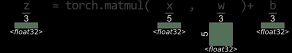

In [19]:
x = torch.ones(5)  # input tensor
y = torch.zeros(3)  # expected output
# randomly initializing weight matrix
w = torch.randn(5, 3, requires_grad=True)
# randomly initializing bias
b = torch.randn(3, requires_grad=True)
# linear operation
with tsensor.explain(): # Just to visualize the tensors
    z = torch.matmul(x, w)+b
# calculating loss (BCE with Logits applies sigmoid internally)
loss = torch.nn.functional.binary_cross_entropy_with_logits(z, y)

Now when PyTorch does this computation, it creates a computational graph internally and keeps track of the variables which are interacting with other variables and also makes sure we can calculate gradients.

All you got to do is call `.backward()` on the loss

In [20]:
loss.backward()
# Gradient of W
print(w.grad)
# Gradient of b
print(b.grad)

tensor([[0.3265, 0.0234, 0.1448],
        [0.3265, 0.0234, 0.1448],
        [0.3265, 0.0234, 0.1448],
        [0.3265, 0.0234, 0.1448],
        [0.3265, 0.0234, 0.1448]])
tensor([0.3265, 0.0234, 0.1448])


Now all you got to do is to use gradient descent to optimize **W** and **b**. And this is simple python core wrapped in a loop. But since tracking all the parameters and making the updates becomes a task in itself as the model size increases, we have an `Optimizer` which wraps this function. We'll see how to use this and write a basic training script in the next section

### My First PyTorch Model
Now let's put it all together and create a simple PyTorch model

#### Creating a Synthetic Linearly Separable Dataset

In [21]:
#Creating a linearly separable dataset
X = torch.rand(100, 2)
# 5y = 6x-1
y = torch.zeros(100)
for i in range(len(X)):
    if (6*X[i,0]-1)/5 < X[i,1]:
        y[i] = 1
    else:
        y[i] = 0


In [22]:
#Plotting
fig = px.scatter(x=X[:,0], y=X[:, 1], color=y.numpy().astype(object), title="Toy Dataset with 2 classes")
fig.update_layout(
    autosize=False,
    width=500,
    height=500,
    showlegend=False
)

#### Define the model

In [23]:
# Must inherit nn.module to be qualified as a Neural Network module
class NeuralNetwork(nn.Module):
    def __init__(self):
        #First line should be to init the parent class
        super(NeuralNetwork, self).__init__()
        # Need to declare w as a parameter of the network
        self.w = nn.Parameter(torch.randn(2, 1, requires_grad=True))
        # Need to declare b as a parameter of the network
        self.b = nn.Parameter(torch.randn(1, requires_grad=True))
    
    #Define the forward pass
    def forward(self, x):
        z = torch.matmul(x, self.w)+self.b
        return torch.sigmoid(z)

In [24]:
learning_rate = 1e-1
epochs = 100

model = NeuralNetwork()
loss_fn = torch.nn.functional.binary_cross_entropy
optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

#### Plotting the Decision Boundary before training

In [25]:
h = .002  # step size in the mesh
x_min, x_max = X[:, 0].min() - 0.2, X[:, 0].max() + 0.2
y_min, y_max = X[:, 1].min() - 0.2, X[:, 1].max() + 0.2

xx, yy = np.meshgrid(np.arange(x_min, x_max, h)
                     , np.arange(y_min, y_max, h))
y_ = np.arange(y_min, y_max, h)

z = torch.from_numpy(np.c_[xx.ravel(), yy.ravel()]).float()

all_pred = model(z).reshape(xx.shape)

all_pred = all_pred.round().detach().numpy().astype(object)

trace1 = go.Heatmap(x=xx[0], y=y_, z=all_pred,
                  colorscale='purp',
                  showscale=False)

trace2 = go.Scatter(x=X[:, 0], y=X[:, 1], 
                    mode='markers',
                    showlegend=False,
                    marker=dict(size=10,
                                color=y, 
                                colorscale='Viridis',
                                line=dict(color='black', width=1))
                    )

fig = go.Figure(data=[trace1, trace2])
fig.update_layout(
    autosize=False,
    width=500,
    height=500,
    showlegend=False
)

#### Training the Model

In [26]:
for epoch in range(epochs):
    for i in range(len(X)):
        # Compute prediction and loss
        _x = X[i,:]
        _y = y[i:i+1]
        pred = model(_x)
        loss = loss_fn(pred, _y)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    loss= loss.item()
    if epoch%10==0:
        print(f"loss: {loss:>7f}  [Iteration {epoch*len(X):>5d}/{epochs*len(X):>5d}]")

loss: 0.386941  [Iteration     0/10000]
loss: 0.170677  [Iteration  1000/10000]
loss: 0.117615  [Iteration  2000/10000]
loss: 0.089586  [Iteration  3000/10000]
loss: 0.071638  [Iteration  4000/10000]
loss: 0.059081  [Iteration  5000/10000]
loss: 0.049811  [Iteration  6000/10000]
loss: 0.042706  [Iteration  7000/10000]
loss: 0.037105  [Iteration  8000/10000]
loss: 0.032590  [Iteration  9000/10000]


#### Plotting the Predictions

In [27]:
pred = model(X).round()

fig = px.scatter(x=X[:,0], y=X[:, 1], color=pred.detach().numpy().ravel().astype(object))
fig.update_layout(
    autosize=False,
    width=500,
    height=500,
    showlegend=False
)

#### Decision Boundary after training

In [28]:
all_pred = model(z).reshape(xx.shape)

all_pred = all_pred.round().detach().numpy().astype(object)

trace1 = go.Heatmap(x=xx[0], y=y_, z=all_pred,
                  colorscale='purp',
                  showscale=False)
trace2 = go.Scatter(x=X[:, 0], y=X[:, 1], 
                    mode='markers',
                    showlegend=False,
                    marker=dict(size=10,
                                color=y, 
                                colorscale='Viridis',
                                line=dict(color='black', width=1))
                    )

fig = go.Figure(data=[trace1, trace2])
fig.update_layout(
    autosize=False,
    width=500,
    height=500,
    showlegend=False
)